## Using selected questions from the 2012 and 2014 editions of the European Social Survey, address the following questions.
## In this dataset, the same participants answered questions in 2012 and again 2014.

1) Did people become less trusting from 2012 to 2014? Compute results for each country in the sample.

2) Did people become happier from 2012 to 2014? Compute results for each country in the sample.

3) Who reported watching more TV in 2012, men or women?

4) Who was more likely to believe people were fair in 2012, people living with a partner or people living alone?

5) Pick three or four of the countries in the sample and compare how often people met socially in 2014. Are there differences, and if so, which countries stand out?

6) Pick three or four of the countries in the sample and compare how often people took part in social activities, relative to others their age, in 2014. Are there differences, and if so, which countries stand out?

In [1]:
# Load in packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

%matplotlib inline

In [2]:
# load in data
path = 'https://raw.githubusercontent.com/Thinkful-Ed/data-201-resources/master/ESS_practice_data/ESSdata_Thinkful.csv'
data = pd.read_csv(path)

In [3]:
print(data.head())
print(data.shape)

  cntry  idno  year  tvtot  ppltrst  pplfair  pplhlp  happy  sclmeet  sclact  \
0    CH   5.0     6    3.0      3.0     10.0     5.0    8.0      5.0     4.0   
1    CH  25.0     6    6.0      5.0      7.0     5.0    9.0      3.0     2.0   
2    CH  26.0     6    1.0      8.0      8.0     8.0    7.0      6.0     3.0   
3    CH  28.0     6    4.0      6.0      6.0     7.0   10.0      6.0     2.0   
4    CH  29.0     6    5.0      6.0      7.0     5.0    8.0      7.0     2.0   

   gndr  agea  partner  
0   2.0  60.0      1.0  
1   2.0  59.0      1.0  
2   1.0  24.0      2.0  
3   2.0  64.0      1.0  
4   2.0  55.0      1.0  
(8594, 13)


# Problem 1: Did people become less trusting from 2012 to 2014? Compute results for each country in the sample.

We know that the same people were asked in each year so we have dependent groups.  We can use many paired t-tests for each pair to determine if the two groups are significantly different or not, based on a particular alpha parameter.  For this case if we found that the mean of the 2014 group vs 2012 (for each country) was less (and significant at the alpha value) we would be able to determine that in 2014 people became less trusting compared to 2012.  Before we can use a parametric test to determine whether or not the people have become less trusting over the years we need to make sure our data is reasonably normal.  If it is we are fine to follow the steps above.

In [4]:
print('{} pairs of t-tests, 1 for each country.'.format(data.cntry.nunique()))

6 pairs of t-tests, 1 for each country.


c:\users\corey\appdata\local\programs\python\python37\lib\site-packages\numpy\lib\histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
c:\users\corey\appdata\local\programs\python\python37\lib\site-packages\numpy\lib\histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


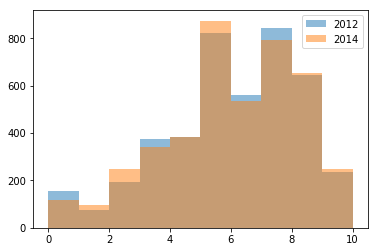

In [5]:
plt.hist(data.ppltrst[data.year==6],label='2012', alpha=.5)
plt.hist(data.ppltrst[data.year==7],label='2014', alpha=.5)
plt.legend()
plt.show()

In [6]:
# pairs of paired t-tests - higher value = more trusting
t_stat = []
p_val = []
trst, sig = [], []

for country in data.cntry.unique():
    # Paired t-test for each country comparing the 2 different years
    print('Comparison for Country:', country)
    print('2012 average: {}\n2014 average: {}'.format(data.ppltrst[(data.cntry==country) & (data.year==6)].mean(), 
                                                      data.ppltrst[(data.cntry==country) & (data.year==7)].mean()))
    print(stats.ttest_rel(data.ppltrst[(data.cntry==country) & (data.year==6)], 
                          data.ppltrst[(data.cntry==country) & (data.year==7)], nan_policy='omit'))
    
    t, p = stats.ttest_rel(data.ppltrst[(data.cntry==country) & (data.year==6)], 
                           data.ppltrst[(data.cntry==country) & (data.year==7)], nan_policy='omit')
    t_stat.append(t)
    p_val.append(p)
    
    if data.ppltrst[(data.cntry==country) & (data.year==6)].mean() <= data.ppltrst[(data.cntry==country) & (data.year==7)].mean():
        trst.append('Not Less Trusting')
    else:
        trst.append('Less Trusting')
        
    if p <= 0.05:
        sig.append('Significant')  
    else:
        sig.append('Not Significant')
    print('-'*50)
    
df_prob1 = pd.DataFrame(list(zip(data.cntry.unique(),t_stat, p_val, trst, sig)), 
                        columns=['country', 't_stat', 'p_val', 'trst', 'sig']).sort_values(by='p_val')

Comparison for Country: CH
2012 average: 5.677878395860285
2014 average: 5.751617076326003
Ttest_relResult(statistic=-0.6586851756725737, pvalue=0.5102943511301135)
--------------------------------------------------
Comparison for Country: CZ
2012 average: 4.362519201228879
2014 average: 4.424657534246576
Ttest_relResult(statistic=-0.5001638336887216, pvalue=0.617129268240474)
--------------------------------------------------
Comparison for Country: DE
2012 average: 5.214285714285714
2014 average: 5.357142857142857
Ttest_relResult(statistic=-0.18399501804849683, pvalue=0.8568563797095805)
--------------------------------------------------
Comparison for Country: ES
2012 average: 5.114591920857379
2014 average: 4.895127993393889
Ttest_relResult(statistic=2.4561906976601646, pvalue=0.014181580725320272)
--------------------------------------------------
Comparison for Country: NO
2012 average: 6.64931506849315
2014 average: 6.598630136986301
Ttest_relResult(statistic=0.5073077081124404,

In [7]:
df_prob1

,country,t_stat,p_val,trst,sig
3,ES,2.456191,0.014182,Less Trusting,Significant
5,SE,-2.067108,0.039008,Not Less Trusting,Significant
0,CH,-0.658685,0.510294,Not Less Trusting,Not Significant
4,NO,0.507308,0.612093,Less Trusting,Not Significant
1,CZ,-0.500164,0.617129,Not Less Trusting,Not Significant
2,DE,-0.183995,0.856856,Not Less Trusting,Not Significant


We can see that the only country that had a statistically significant decrease in trust is Spain.  The only other country that had a statistically significant change in trust was Sweden.

# Problem 2: Did people become happier from 2012 to 2014? Compute results for each country in the sample.

Same process as 1 just change the variable.

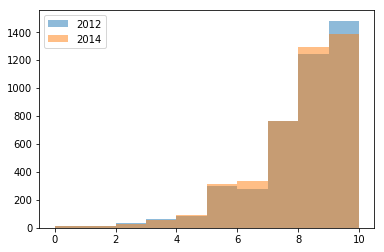

In [8]:
plt.hist(data.happy[data.year==6],label='2012', alpha=.5)
plt.hist(data.happy[data.year==7],label='2014', alpha=.5)
plt.legend()
plt.show()

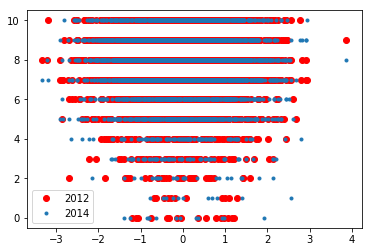

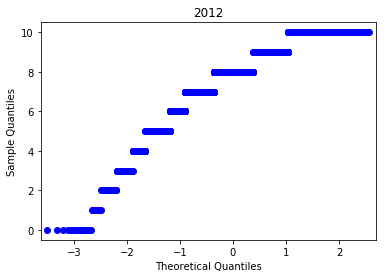

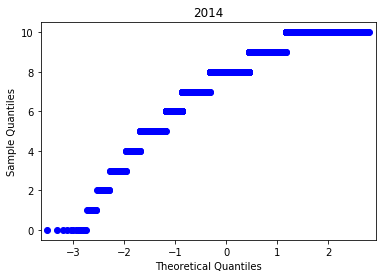

In [9]:
# QQ Plot to confirm non normality
qtest12 = np.random.normal(0,1,data.happy[data.year==6].size)
qtest14 = np.random.normal(0,1,data.happy[data.year==7].size)

plt.plot(qtest12, data.happy[data.year==6], 'o', color='r', label='2012')
plt.plot(qtest12, data.happy[data.year==7], '.', label='2014')
plt.legend()
plt.show()

sm.qqplot(data.happy[data.year==6])
plt.title('2012')
plt.show()
sm.qqplot(data.happy[data.year==7])
plt.title('2014')
plt.show()

From the looks of the looks of the top plot and the histograms we have a non normal distribution.  The bottom QQplots from statsmodels is showing some linear trends - not sure about this.  Let's treat this variable as non normal and use a non-parametric test for independence.

In [10]:
t_stat = []
p_val = []
hap, sig = [], []

for country in data.cntry.unique():
    # Paired t-test for each country comparing the 2 different years
    print('Comparison for Country:', country)
    print('2012 average: {}\n2014 average: {}'.format(data.happy[(data.cntry==country) & (data.year==6)].mean(), 
                                                      data.happy[(data.cntry==country) & (data.year==7)].mean()))
    print(stats.wilcoxon(data.happy[(data.cntry==country) & (data.year==6)], 
                          data.happy[(data.cntry==country) & (data.year==7)]))
    
    t, p = stats.wilcoxon(data.happy[(data.cntry==country) & (data.year==6)], 
                           data.happy[(data.cntry==country) & (data.year==7)])
    t_stat.append(t)
    p_val.append(p)
    
    if data.happy[(data.cntry==country) & (data.year==6)].mean() <= data.happy[(data.cntry==country) & (data.year==7)].mean():
        hap.append('Happier')
    else:
        hap.append('Not Happier')
        
    if p <= 0.05:
        sig.append('Significant')  
    else:
        sig.append('Not Significant')
    print('-'*50)
    
df_prob2 = pd.DataFrame(list(zip(data.cntry.unique(),t_stat, p_val, hap, sig)), 
                        columns=['country', 't_stat', 'p_val', 'hap', 'sig']).sort_values(by='p_val')

Comparison for Country: CH
2012 average: 8.088311688311688
2014 average: 8.116429495472186
WilcoxonResult(statistic=92816.5, pvalue=0.8208688161425343)
--------------------------------------------------
Comparison for Country: CZ
2012 average: 6.7708978328173375
2014 average: 6.914110429447852
WilcoxonResult(statistic=73213.0, pvalue=0.01064243454053068)
--------------------------------------------------
Comparison for Country: DE
2012 average: 7.428571428571429
2014 average: 7.857142857142857
WilcoxonResult(statistic=23.5, pvalue=0.393351316918508)
--------------------------------------------------
Comparison for Country: ES
2012 average: 7.548679867986799
2014 average: 7.41996699669967
WilcoxonResult(statistic=231958.5, pvalue=0.04923868084306013)
--------------------------------------------------
Comparison for Country: NO
2012 average: 8.25171939477304
2014 average: 7.9151846785225715
WilcoxonResult(statistic=67571.5, pvalue=2.7264367804254175e-06)
---------------------------------

c:\users\corey\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\morestats.py:2391: RuntimeWarning: invalid value encountered in greater
  r_plus = np.sum((d > 0) * r, axis=0)
c:\users\corey\appdata\local\programs\python\python37\lib\site-packages\scipy\stats\morestats.py:2392: RuntimeWarning: invalid value encountered in less
  r_minus = np.sum((d < 0) * r, axis=0)


In [11]:
df_prob2

,country,t_stat,p_val,hap,sig
4,NO,67571.5,0.000003,Not Happier,Significant
1,CZ,73213.0,0.010642,Happier,Significant
3,ES,231958.5,0.049239,Not Happier,Significant
2,DE,23.5,0.393351,Happier,Not Significant
5,SE,125481.0,0.513640,Happier,Not Significant
0,CH,92816.5,0.820869,Happier,Not Significant


From the table above we see that only the Czech are statistically significantly happier in 2014.  Norway and Spain are both statistically not happier.

The above test was also tried assuming a normal distribution with the paired t-test and from that Norway was the only statistically significant result.

# Problem 3: Who reported watching more TV in 2012, men or women?

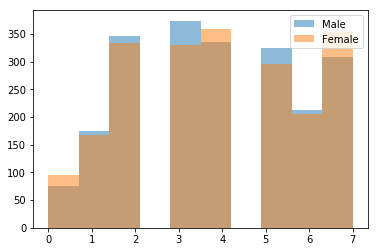

In [12]:
tv12_m = data['tvtot'][(data.year==6)&(data.gndr==1)]
tv12_f = data['tvtot'][(data.year==6)&(data.gndr==2)]

plt.hist(tv12_m,alpha=0.5, label='Male')
plt.hist(tv12_f,alpha=0.5, label='Female')
plt.legend()
plt.show()

Since we have a normal distribution and two independent samples this is going to be an independent t-test.

In [13]:
# is the average tv total watching time for men higher or lower?
print('Average 2012 male total tv: {}\nAverage 2012 female total tv: {}'.format(tv12_m.mean(), tv12_f.mean()))

stats.ttest_ind(tv12_m,tv12_f, nan_policy='omit')

Average 2012 male total tv: 3.901906090190609
Average 2012 female total tv: 3.944392523364486


Ttest_indResult(statistic=-0.6899928109209502, pvalue=0.49023604027095813)

Men on average did watch more tv then women over all but the result is NOT statistically significant.

# Problem 4:  Who was more likely to believe people were fair in 2012, people living with a partner or people living alone?

In [14]:
fair12_part = data.pplfair[(data.year==6)&(data.partner==1)]
fair12_alone = data.pplfair[(data.year==6)&(data.partner==2)]

print('Average 2012 fairness rate for people with partners: {}\n'
      'Average 2012 fairness rate for people without partners: {}'.format(fair12_part.mean(), fair12_alone.mean()))

stats.ttest_ind(fair12_part, fair12_alone, nan_policy='omit')

Average 2012 fairness rate for people with partners: 6.080736012016523
Average 2012 fairness rate for people without partners: 5.856965174129353


Ttest_indResult(statistic=3.3201033970362084, pvalue=0.0009073952609876207)

People who live with partners are more likely to believe people are fair in 2012 than people who live alone.

# Problem 5: Pick three or four of the countries in the sample and compare how often people met socially in 2014. Are there differences, and if so, which countries stand out?

In [15]:
val = []
labels = []
for country in data.cntry.unique():
    
    # Get the social meet data from each country
    vals = data.sclmeet[(data['cntry'] == country)&(data.year==7)].dropna().values
    val.append(vals)
    
    # Get labels for each data point
    label = np.repeat(country,len(vals))
    labels.append(label)

In [27]:
# turn list of lists into one list
flat_val = [value for sublist in val for value in sublist]
flat_lab = [label for sublist in labels for label in sublist]

# turn into single array
f_val = np.array(flat_val)
f_lab = np.array(flat_lab)

# Run Tukey Honest Significant Differences Tests at alpha=0.5
tukey = pairwise_tukeyhsd(endog=f_val, groups=f_lab, alpha=0.05)
tukey.summary()

group1,group2,meandiff,lower,upper,reject
CH,CZ,-0.7148,-0.927,-0.5027,True
CH,DE,-0.7321,-1.8089,0.3448,False
CH,ES,0.0995,-0.0844,0.2834,False
CH,NO,0.1417,-0.0644,0.3478,False
CH,SE,0.2656,0.0701,0.4611,True
CZ,DE,-0.0172,-1.0958,1.0614,False
CZ,ES,0.8143,0.6206,1.008,True
CZ,NO,0.8565,0.6417,1.0714,True
CZ,SE,0.9804,0.7757,1.1851,True
DE,ES,0.8315,-0.2419,1.9049,False


# Problem 6: Pick three or four of the countries in the sample and compare how often people took part in social activities, relative to others their age, in 2014. Are there differences, and if so, which countries stand out?

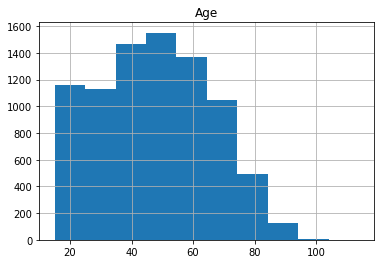

83


In [30]:
data.agea.hist()
plt.title('Age')
plt.show()

print(data.agea.nunique())

Do I really need to get 3403 different test results to answer this questions or should I bin the ages to make it more reasonable.

In [40]:
val = []
labels = []

for age in data.agea.unique():
    for country in data.cntry.unique():

        
        # Get the social meet data from each country
        vals = data.sclmeet[(data['cntry'] == country)&(data.year==7)&(data.agea==age)].dropna().values
        val.append(vals)

        # Get labels for each data point
        label = np.repeat(str(country)+str(age),len(vals))
        labels.append(label)

In [41]:
# turn list of lists into one list
flat_val = [value for sublist in val for value in sublist]
flat_lab = [label for sublist in labels for label in sublist]

# turn into single array
f_val = np.array(flat_val)
f_lab = np.array(flat_lab)

# Run Tukey Honest Significant Differences Tests at alpha=0.5
tukey = pairwise_tukeyhsd(endog=f_val, groups=f_lab, alpha=0.05)
tukey.summary()

group1,group2,meandiff,lower,upper,reject
CH16.0,CH17.0,0.1104,-2.5471,2.7679,False
CH16.0,CH18.0,-0.1818,-2.6175,2.2538,False
CH16.0,CH19.0,-0.7413,-3.4434,1.9609,False
CH16.0,CH20.0,-0.0325,-2.69,2.6251,False
CH16.0,CH21.0,-0.7071,-3.2313,1.8172,False
CH16.0,CH22.0,0.4818,-2.4001,3.3637,False
CH16.0,CH23.0,0.039,-2.6186,2.6965,False
CH16.0,CH24.0,-0.8182,-5.1143,3.4779,False
CH16.0,CH25.0,0.2587,-2.4434,2.9609,False
CH16.0,CH26.0,-0.3182,-5.3884,4.752,False
